<div align="center">
<p align="center" style="width: 100%;">
    <img src="https://raw.githubusercontent.com/vlm-run/.github/refs/heads/main/profile/assets/vlm-black.svg" alt="VLM Run Logo" width="80" style="margin-bottom: -5px; color: #2e3138; vertical-align: middle; padding-right: 5px;"><br>
</p>
<p align="center"><a href="https://docs.vlm.run"><b>Website</b></a> | <a href="https://docs.vlm.run/"><b>API Docs</b></a> | <a href="https://docs.vlm.run/blog"><b>Blog</b></a> | <a href="https://discord.gg/AMApC2UzVY"><b>Discord</b></a>
</p>
<p align="center">
<a href="https://discord.gg/AMApC2UzVY"><img alt="Discord" src="https://img.shields.io/badge/discord-chat-purple?color=%235765F2&label=discord&logo=discord"></a>
<a href="https://twitter.com/vlmrun"><img alt="Twitter Follow" src="https://img.shields.io/twitter/follow/vlmrun.svg?style=social&logo=twitter"></a>
</p>
</div>

# 🎨 Exploring VLM Hub Schemas

A guide to understanding and using VLM's diverse schema collection covering different visual content.

## Prerequisites

* Python 3.9+
* VLM Run API key (get one at [vlm.run](https://vlm.run))

## Setup

First, let's install the required packages:

In [1]:
! pip install vlmrun --upgrade --quiet
! pip install vlmrun-hub --upgrade --quiet

The `VLMRun` client provides the most intuitive way to interact with the VLM API. Let's initialize the client

In [2]:
import os
import getpass

VLMRUN_BASE_URL = os.getenv("VLMRUN_BASE_URL", "https://dev.vlm.run/v1")
VLMRUN_API_KEY = os.getenv("VLMRUN_API_KEY", None)
if VLMRUN_API_KEY is None:
    VLMRUN_API_KEY = getpass.getpass()

 ········


In [3]:
from vlmrun.client import VLMRun

client = VLMRun(base_url=VLMRUN_BASE_URL, api_key=VLMRUN_API_KEY)

Now, let's explore the rich collection of schemas present in VLM Hub

In [4]:
from vlmrun.hub.registry import Registry
from vlmrun.hub.schemas import import_all

# Import all schemas into registry
import_all()

/Users/kaushikbokka/apps/vlmrun-hub/venv/lib/python3.10/site-packages/pydantic/_internal/_fields.py:192: UserWarning: Field name "schema" in "SchemaCatalogItem" shadows an attribute in parent "BaseModel"
  warnings.warn(
2025-02-06 15:07:15.222 | DEBUG    | vlmrun.hub.schemas:import_all:27 - 
Registry [schemas=14]
  document.bank-statement :: BankStatement
  document.invoice :: Invoice
  document.receipt :: Receipt
  document.resume :: Resume
  document.us-drivers-license :: USDriversLicense
  document.utility-bill :: UtilityBill
  document.w2-form :: W2Form
  aerospace.remote-sensing :: RemoteSensing
  healthcare.medical-insurance-card :: MedicalInsuranceCard
  retail.ecommerce-product-caption :: RetailEcommerceProductCaption
  media.tv-news :: TVNews
  document.us-passport :: USPassport
  media.nfl-game-state :: NFLGameState
  media.nba-game-state :: NBAGameState


In [5]:
# List available schemas
available_schemas = Registry.list()
print(f"Available schemas in VLM Hub: {len(available_schemas)}")

Available schemas in VLM Hub: 14


In [8]:
# Group schemas by category
schema_categories = {}
for schema_name in available_schemas:
    category = schema_name.split('.')[0]
    if category not in schema_categories:
        schema_categories[category] = []
    schema_categories[category].append(schema_name)

for category, schemas in schema_categories.items():
    print(f"\n🔹 {category.upper()} ({len(schemas)} schema(s)):")
    for schema in schemas:
        schema_class = Registry.get()[schema]
        schema_json = schema_class.model_json_schema()
        print(f"  - {schema}")


🔹 DOCUMENT (8 schema(s)):
  - document.bank-statement
  - document.invoice
  - document.receipt
  - document.resume
  - document.us-drivers-license
  - document.utility-bill
  - document.w2-form
  - document.us-passport

🔹 AEROSPACE (1 schema(s)):
  - aerospace.remote-sensing

🔹 HEALTHCARE (1 schema(s)):
  - healthcare.medical-insurance-card

🔹 RETAIL (1 schema(s)):
  - retail.ecommerce-product-caption

🔹 MEDIA (3 schema(s)):
  - media.tv-news
  - media.nfl-game-state
  - media.nba-game-state


## 📄 Document Intelligence

VLM Run excels at processing various document types. Let's explore some key examples:

In [10]:
from vlmrun.common.utils import remote_image
from IPython.display import Image, display, Markdown

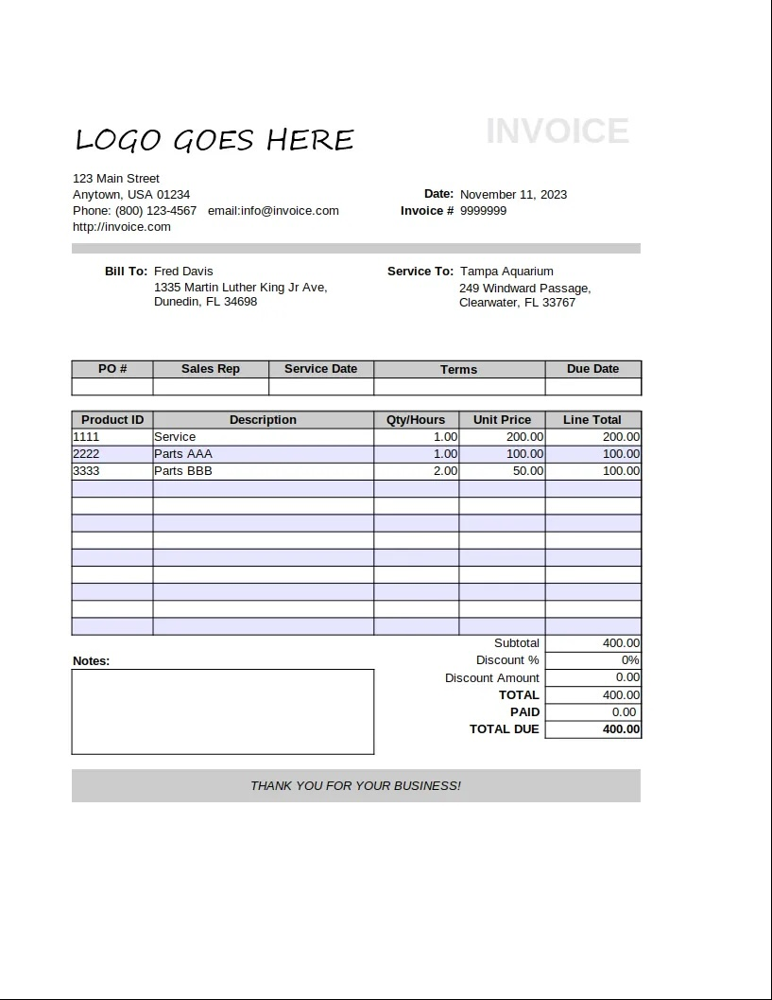

In [13]:
# 1. Invoice Analysis
invoice_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/document.invoice/invoice_1.jpg")

display(invoice_image)

In [37]:
from vlmrun.hub.schemas.document.invoice import Invoice
from vlmrun.client.types import GenerationConfig

invoice_result = client.image.generate(
    images=[invoice_image],
    domain="document.invoice",
    config=GenerationConfig(
        json_schema=Invoice.model_json_schema()
    )
)
print("\nInvoice Analysis Results:")
print(invoice_result)


Invoice Analysis Results:
id='39cd5a81-5b3e-40a0-86b9-d965852269a5' created_at=datetime.datetime(2025, 2, 6, 10, 16, 50, 947799) completed_at=datetime.datetime(2025, 2, 6, 10, 17, 2, 271605) response={'invoice_id': '9999999', 'period_start': None, 'period_end': None, 'invoice_issue_date': '2023-11-11', 'invoice_due_date': None, 'order_id': None, 'customer_id': None, 'issuer': None, 'issuer_address': {'street': '123 Main Street', 'city': 'Anytown', 'state': None, 'postal_code': '01234', 'country': 'USA'}, 'customer': 'Fred Davis', 'customer_email': 'info@invoice.com', 'customer_phone': '(800) 123-4567', 'customer_billing_address': {'street': '1335 Martin Luther King Jr Ave', 'city': 'Dunedin', 'state': 'FL', 'postal_code': '34698', 'country': 'USA'}, 'customer_shipping_address': {'street': '249 Windward Passage', 'city': 'Clearwater', 'state': 'FL', 'postal_code': '33767', 'country': 'USA'}, 'items': [{'description': 'Service', 'quantity': 1, 'currency': None, 'unit_price': 200.0, 'tot

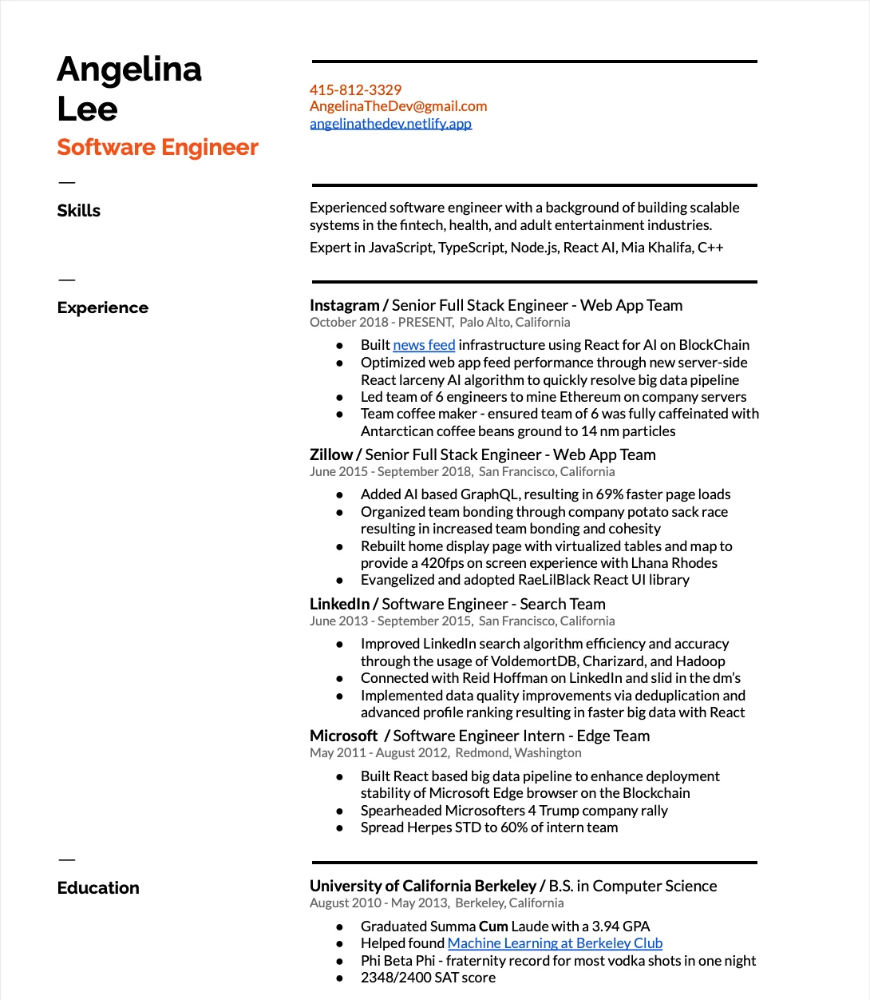

In [22]:
# 2. Resume Parsing

resume_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/document.resume/fake-resume.webp")
display(resume_image)

In [26]:
from vlmrun.hub.schemas.document.resume import Resume

resume_result = client.image.generate(
    images=[resume_image],
    domain="document.resume",
    config=GenerationConfig(
        json_schema=Resume.model_json_schema()
    )
)

print("\nResume Analysis Results:")
print(resume_result)


Resume Analysis Results:
id='5852da2b-38d6-4cdc-ae68-dec95651ed6a' created_at=datetime.datetime(2025, 2, 6, 10, 8, 10, 620375) completed_at=datetime.datetime(2025, 2, 6, 10, 8, 31, 739013) response={'contact_info': {'full_name': 'Angelina Lee', 'email': 'AngelinaTheDev@gmail.com', 'phone': '415-812-3329', 'address': None, 'linkedin': None, 'github': None, 'portfolio': 'https://angelinathedev.netlify.app/', 'google_scholar': None}, 'summary': 'Experienced software engineer with a background of building scalable systems in the fintech, health, and adult entertainment industries. Expert in JavaScript, TypeScript, Node.js, React AI, Mia Khalifa, C++', 'education': [{'institution': 'University of California Berkeley', 'degree': 'B.S. in Computer Science', 'field_of_study': 'Computer Science', 'graduation_date': '2013-05-01', 'gpa': 3.94, 'honors': ['Graduated Summa Cum Laude', 'Phi Beta Phi - fraternity record for most vodka shots in one night'], 'relevant_courses': ['Machine Learning at B

## 🆔 Identity Document Analysis

VLM Run can securely process various identity documents:

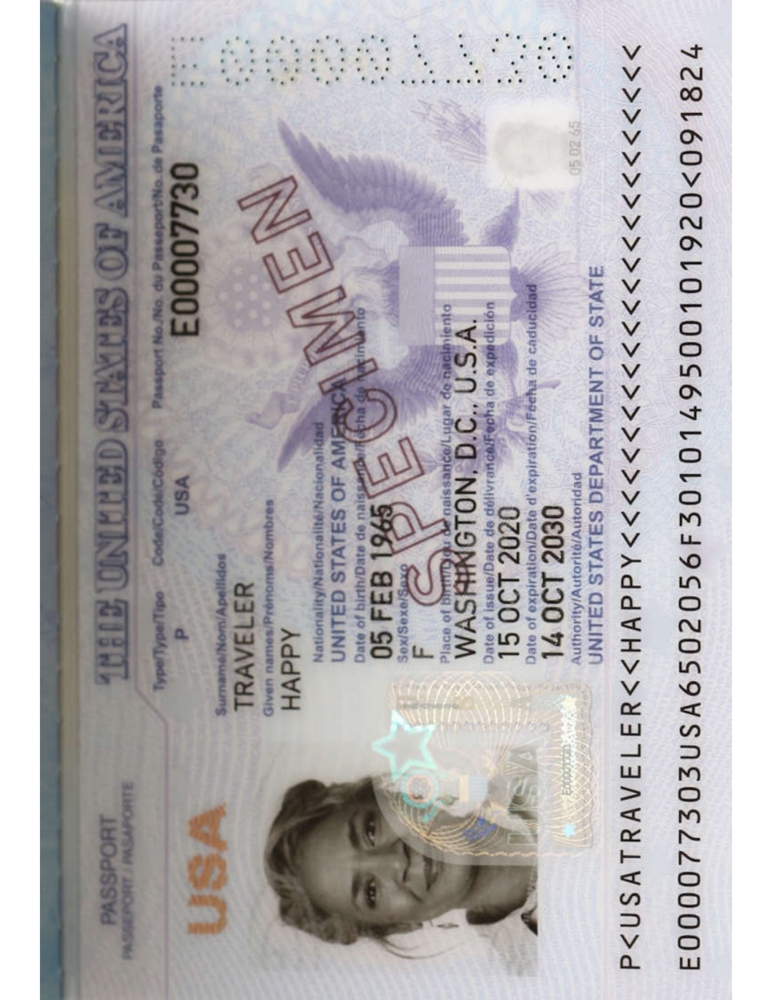

In [28]:
# US Passport Analysis

passport_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/document.us-passport/2020-Next-Gen-US-Passport.png")
display(passport_image)

In [33]:
# from vlmrun.hub.schemas.contrib.document.us_passport import USPassport

# passport_result = client.image.generate(
#     images=[passport_image],
#     domain="document.us-passport",
# )
# print("\nPassport Analysis Results:")
# print(passport_result)
# print(USPassport)

## 🏥 Healthcare Document Processing

Healthcare-specific document analysis:

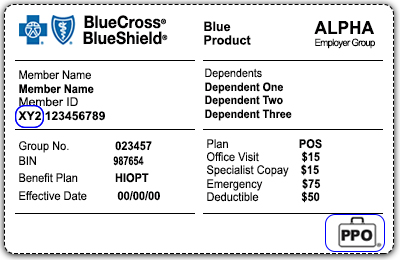

In [35]:
# Medical Insurance Card
insurance_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/healthcare.medical-insurance-card/blue_cross_example.jpg")
display(insurance_image)

In [38]:
# insurance_result = client.image.generate(
#     images=[insurance_image],
#     domain="healthcare.medical-insurance-card"
# )
# print("\nInsurance Card Analysis Results:")
# print(insurance_result)

## 🎮 Sports & Media Analysis

VLM Run can analyze sports content and media:

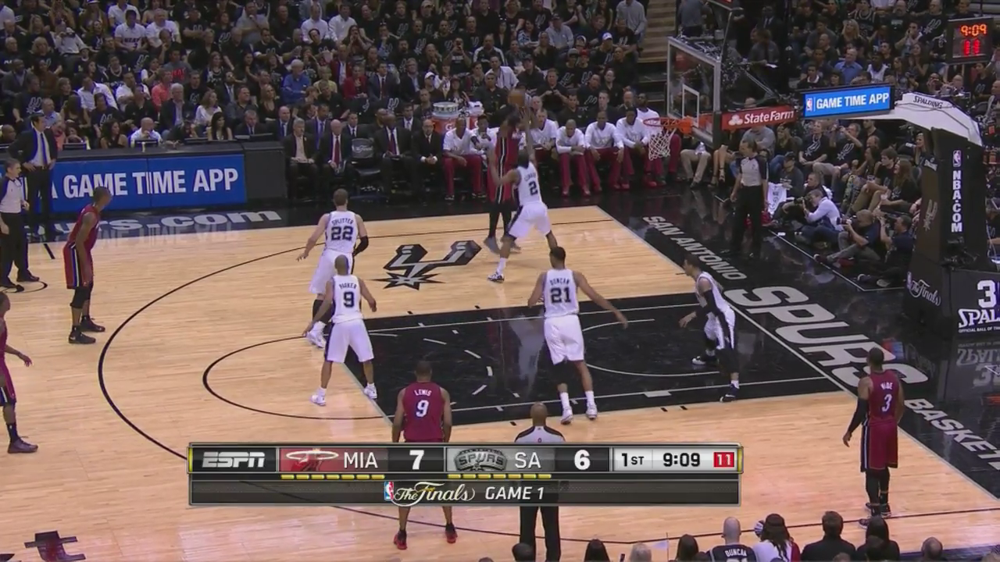

In [42]:
# NBA Game Analysis
nba_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/media.nba-game-state/heats_spurs.png")
display(nba_image)

In [44]:
# nba_result = client.image.generate(
#     images=[nba_image],
#     domain="media.nba-game-state"
# )
# print("\nNBA Game Analysis Results:")
# print(nba_result)

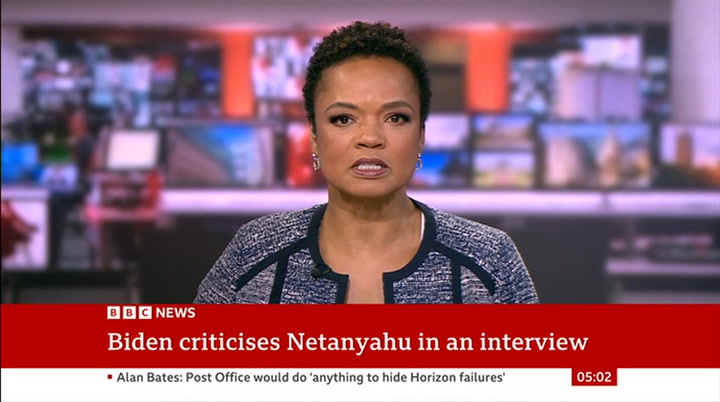

In [46]:
# TV News Analysis
news_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/media.tv-news/bbc_news_ukraine_screenshot.jpg")
display(news_image)

In [48]:
# news_result = client.image.generate(
#     images=[news_image],
#     domain="media.tv-news"
# )
# print("\nTV News Analysis Results:")
# print(news_result)

## 🛰️ Aerospace & Remote Sensing

Analyzing satellite and aerial imagery:

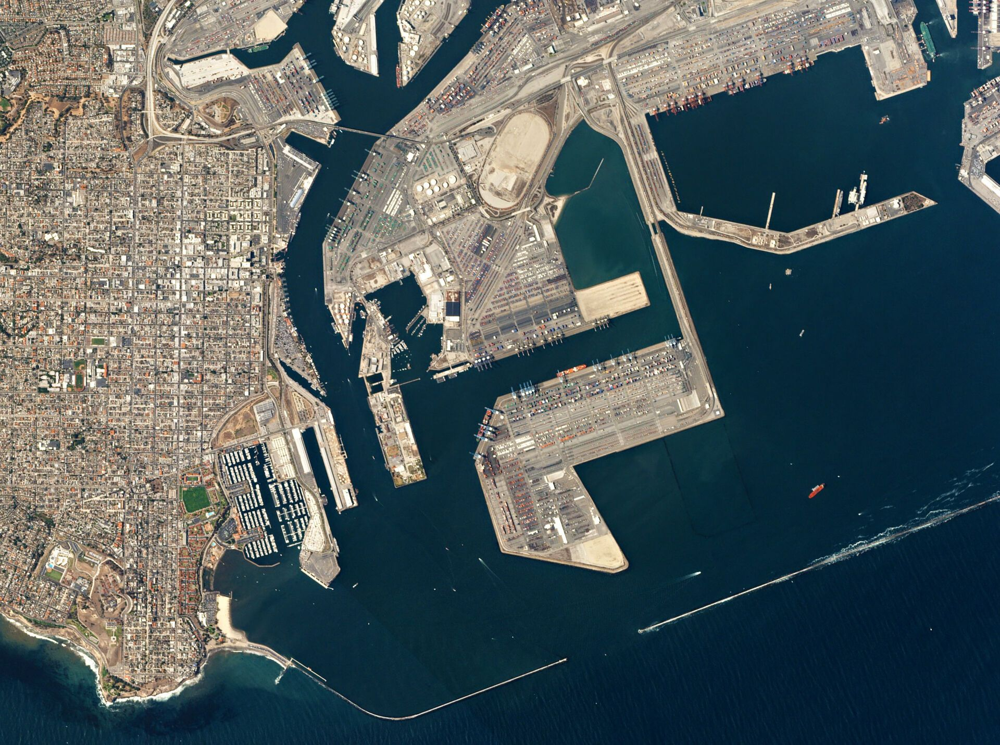

In [50]:
# Remote Sensing Analysis
satellite_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/aerospace.remote-sensing/planet_labs_port.jpg")
display(satellite_image)

In [52]:
# satellite_result = client.image.generate(
#     images=[satellite_image],
#     domain="aerospace.remote-sensing"
# )
# print("\nRemote Sensing Analysis Results:")
# print(satellite_result)

## 🛍️ E-commerce & Retail

Product analysis and categorization:

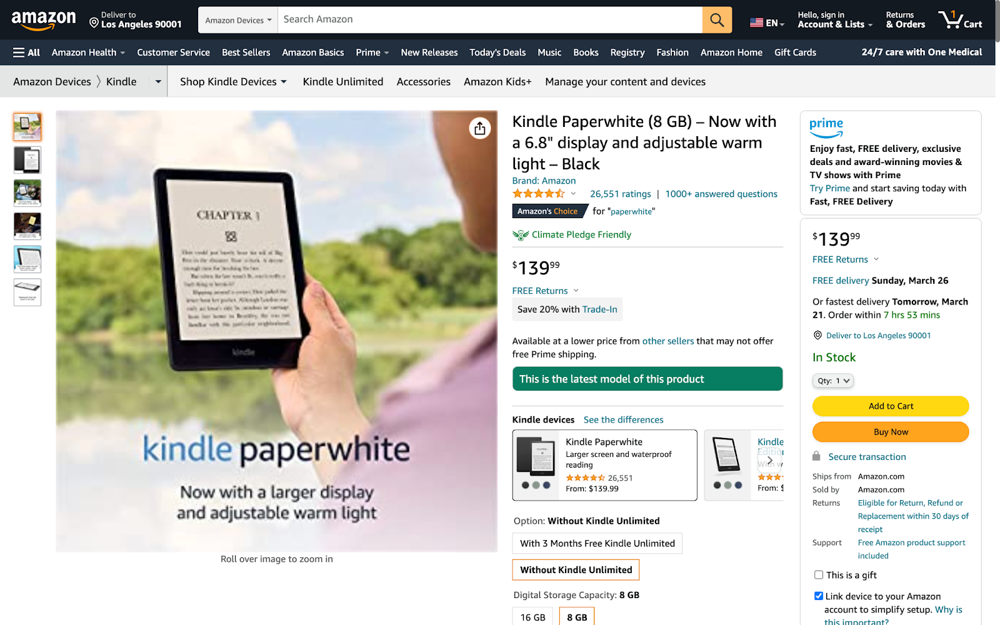

In [53]:
# Product Analysis
product_image = remote_image("https://storage.googleapis.com/vlm-data-public-prod/hub/examples/retail.ecommerce-product-caption/Electronics%20-%20Kindle.webp")
display(product_image)

In [55]:
# product_result = client.image.generate(
#     images=[product_image],
#     domain="retail.ecommerce-product-caption"
# )
# print("\nProduct Analysis Results:")
# print(product_result)

## 💡 Pro Tips for Using VLM Schemas

1. Choosing the Right Schema:
   - Use specific schemas for better results
   - Check schema field for ideal use cases
   - Consider domain-specific requirements
   - Experiment with different field and description if needed

2. Best Practices:
   - Ensure good image quality
   - Handle errors appropriately
   - Validate outputs against schema requirements

3. Common Use Cases:
   - Document Processing: Invoices, resumes, IDs
   - Healthcare: Insurance cards, patient intake forms
   - Sports & Media: Game analysis, news content
   - Retail: Product cataloging, ad analysis
   - Aerospace: Satellite imagery analysis